In [ ]:
!pip install segmentation_models==1.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.2 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import os
import glob as gb
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
import tensorflow
from tensorflow import keras
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D , MaxPooling2D ,concatenate ,Input ,Dropout ,Conv2DTranspose
import segmentation_models as sm
from skimage.io import imread, imshow
from skimage.transform import resize

keras.backend.set_image_data_format('channels_last')


Segmentation Models: using `tf.keras` framework.


In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download -d vpapenko/nails-segmentation

 96% 25.0M/26.2M [00:00<00:00, 107MB/s] 
100% 26.2M/26.2M [00:00<00:00, 96.6MB/s]


In [ ]:
! unzip nails-segmentation.zip

In [ ]:
os.chdir('/content/nails_segmentation')
x_train_dir = '/content/nails_segmentation/images/'
y_train_dir = '/content/nails_segmentation/labels/'

img_names = sorted([x_train_dir + filename for filename in os.listdir(x_train_dir)])
mask_names = sorted([y_train_dir + filename for filename in os.listdir(y_train_dir)])
img_names.remove('/content/nails_segmentation/images/.ipynb_checkpoints' )
mask_names.remove('/content/nails_segmentation/labels/.ipynb_checkpoints')
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(img_names, mask_names, test_size=0.2, random_state=0)

In [ ]:
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

# helper function for data visualization
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x


# classes for data loading and preprocessing
class Dataset:
    """

    Args:
        images_dir (str): path to images
        masks_dir (str): path to segmentation masks
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing
            (e.g. noralization, shape manipulation, etc.)

    """
    CLASSES = ['nails', 'background']
    def __init__(
            self,
            images,
            masks,
            classes=None,
            augmentation=None,
            preprocessing=None,
    ):

        self.images_fps = images
        self.masks_fps = masks
        # convert str names to class values on masks
        self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]

        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def __getitem__(self, i):

        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks_fps[i], 0)

        # extract certain classes from mask (e.g. cars)
        masks = [(mask == v) for v in self.class_values]
        mask = np.stack(masks, axis=-1).astype('float')

        # add background if mask is not binary
        if mask.shape[-1] != 1:
            background = 1 - mask.sum(axis=-1, keepdims=True)
            mask = np.concatenate((mask, background), axis=-1)

        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask

    def __len__(self):
        return len(self.images_fps)


class Dataloder(keras.utils.Sequence):
    """Load data from dataset and form batches

    Args:
        dataset: instance of Dataset class for image loading and preprocessing.
        batch_size: Integet number of images in batch.
        shuffle: Boolean, if `True` shuffle image indexes each epoch.
    """

    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

        self.on_epoch_end()

    def __getitem__(self, i):

        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        data = []
        for j in range(start, stop):
            data.append(self.dataset[j])

        # transpose list of lists
        batch = [np.stack(samples, axis=0) for samples in zip(*data)]

        return batch

    def __len__(self):
        """Denotes the number of batches per epoch"""
        return len(self.indexes) // self.batch_size

    def on_epoch_end(self):
        """Callback function to shuffle indexes each epoch"""
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)

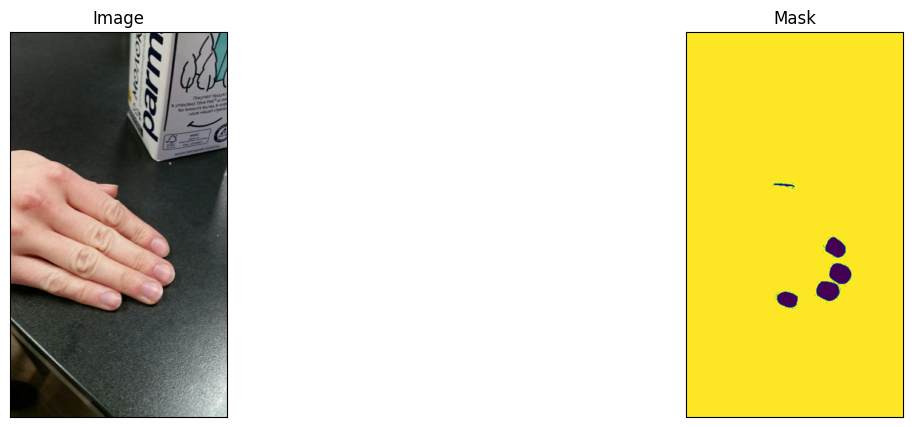

In [ ]:
dataset = Dataset(x_train, y_train, classes=['nails'])

for i in range(1):
  image, mask = dataset[i] # get some sample
  visualize(
      image=image,
     mask=mask.squeeze(),

  )

In [ ]:
import albumentations as A

In [ ]:

# define heavy augmentations
def get_training_augmentation():
    train_transform = [

        A.HorizontalFlip(p=0.5),
        A.Resize(320, 320),

        A.IAAAdditiveGaussianNoise(p=0.2), #mean of distributoin - 0.2
        A.IAAPerspective(p=0.5), #add perspective

        A.OneOf( # choose one with p =0.9
            [
                A.CLAHE(p=1), #адаптивное выравнивание гистограммы с ограниченным контрастом
                A.RandomBrightness(p=1),
                A.RandomGamma(p=1), #add gamma distribution for values
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.IAASharpen(p=1), #резкость
                A.Blur(blur_limit=3, p=1),
                A.MotionBlur(blur_limit=3, p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.RandomContrast(p=1), #случайный контраст

            ],
            p=0.9,
        ),

    ]
    return A.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        A.Resize(320,320)
    ]
    return A.Compose(test_transform)

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform

    Args:
        preprocessing_fn (callbale): data normalization function
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose

    """

    _transform = [
        A.Lambda(image=preprocessing_fn),
    ]
    return A.Compose(_transform)

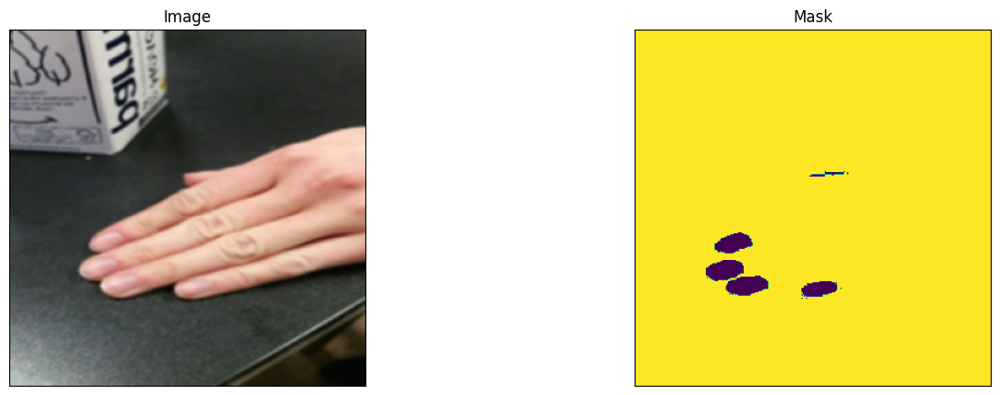

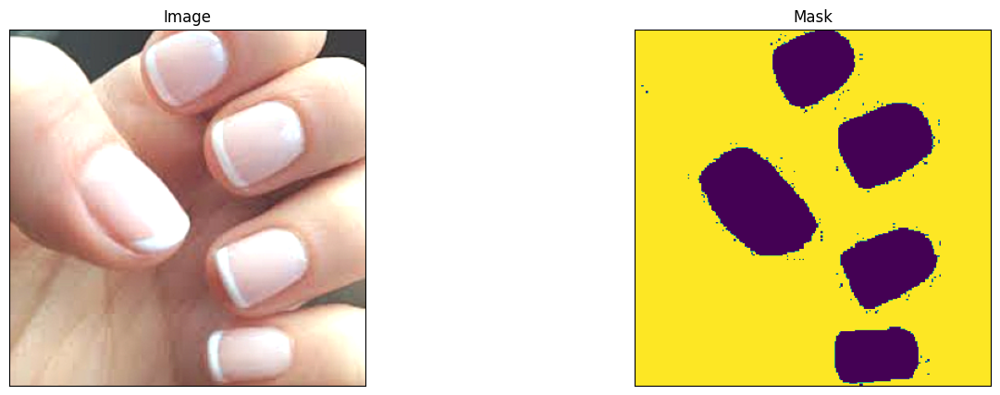

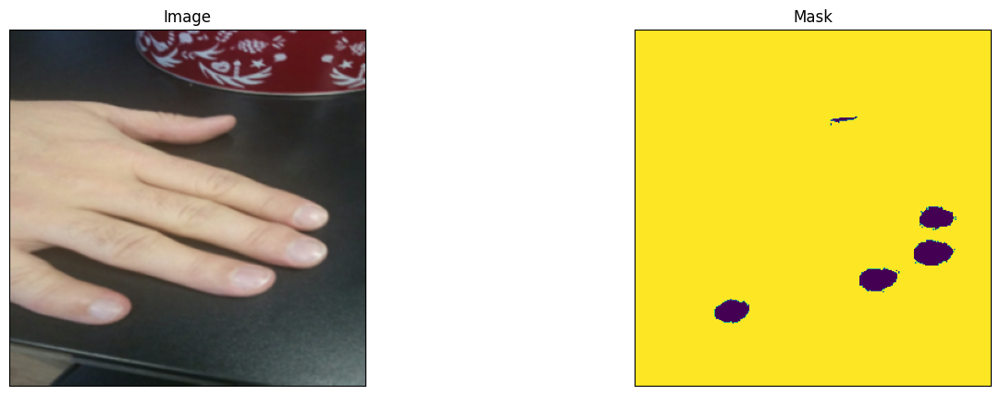

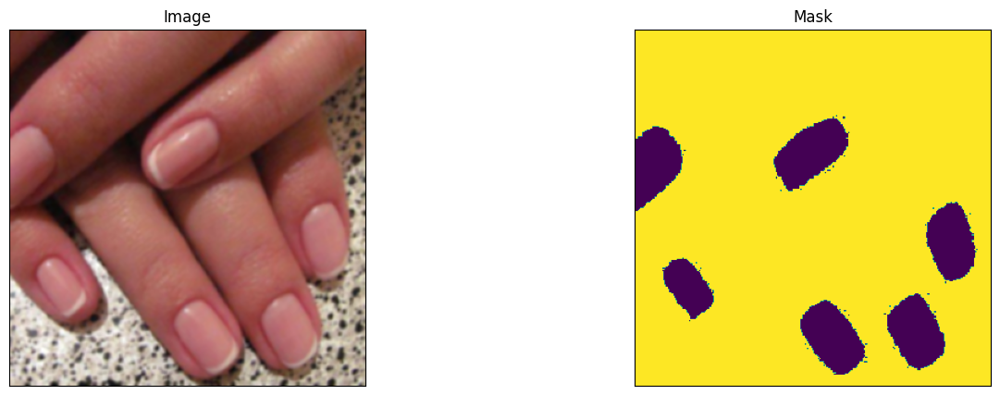

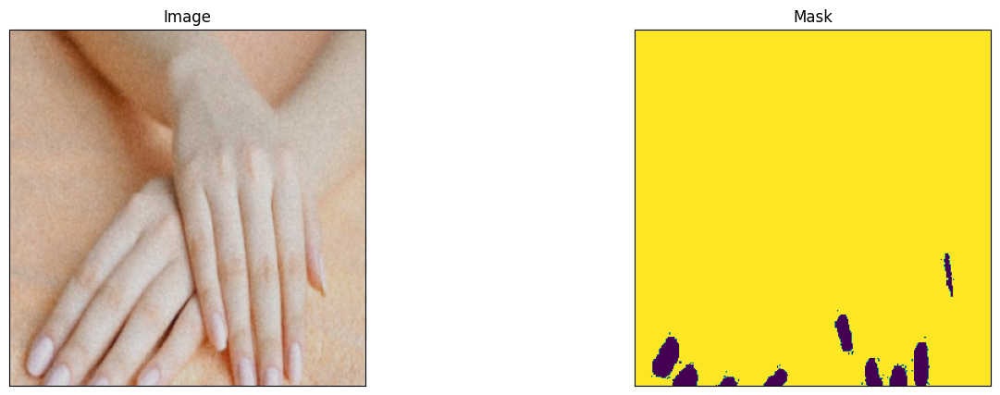

...

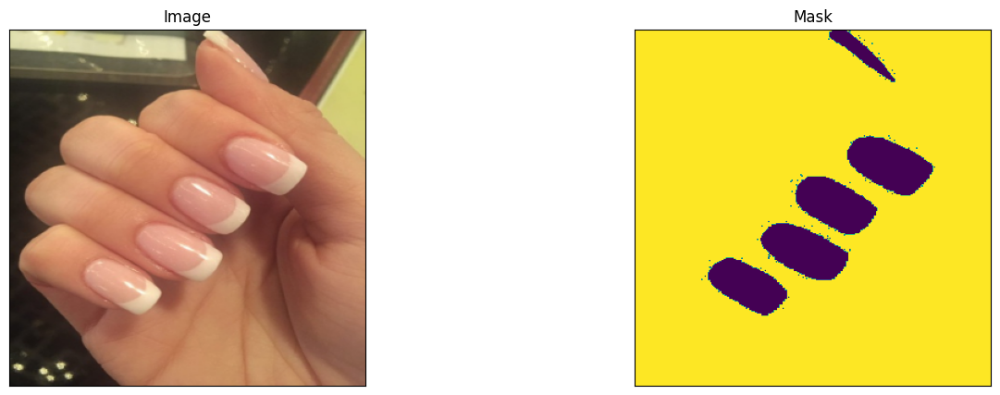

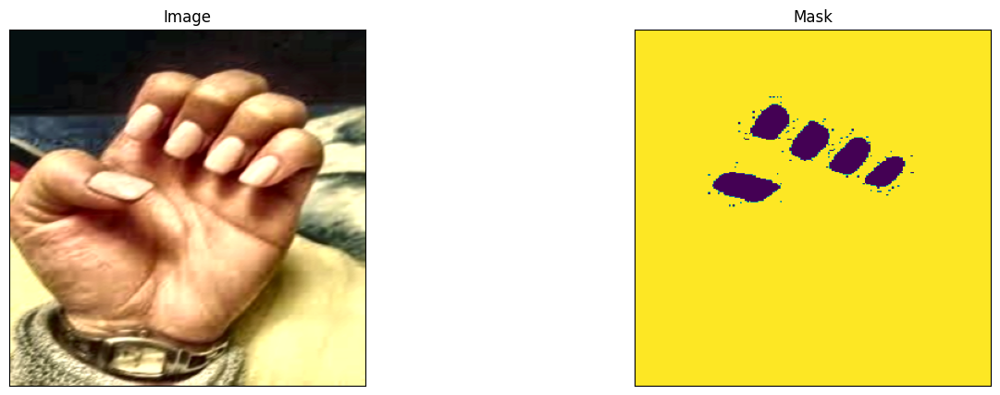

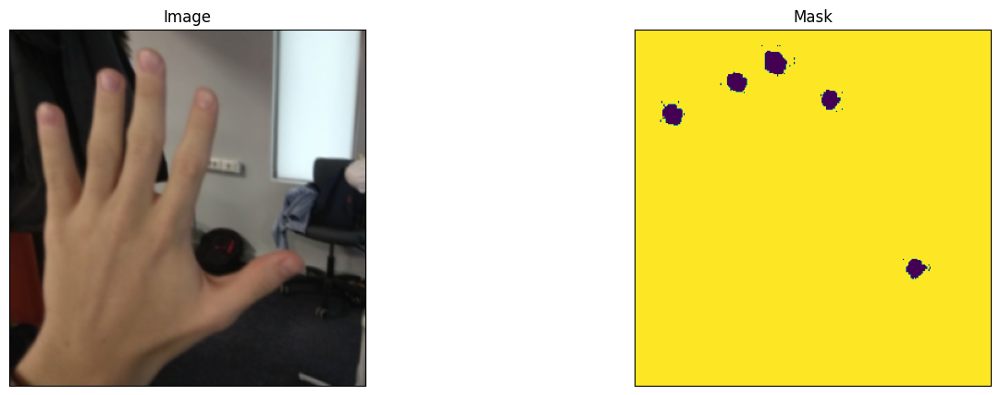

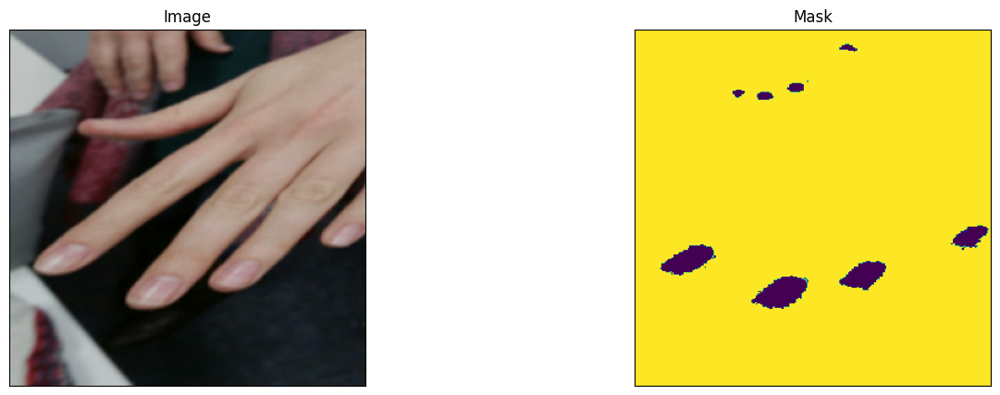

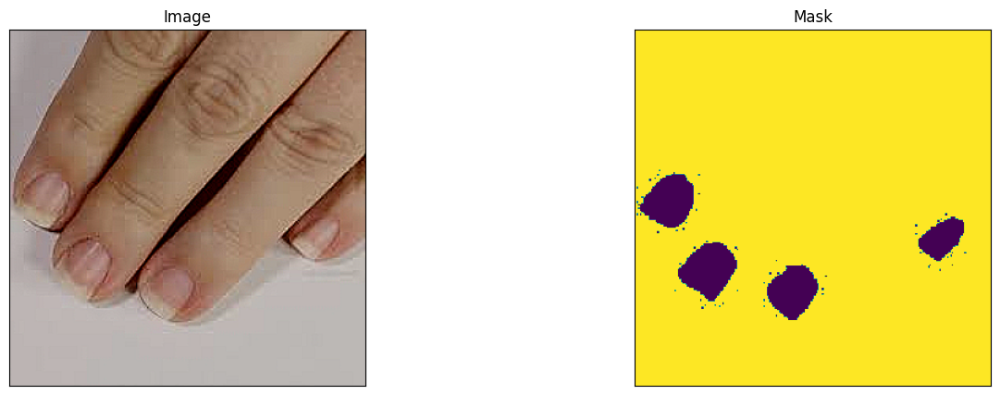

In [ ]:
dataset = Dataset(x_train, y_train, classes=['nails'], augmentation=get_training_augmentation())

for i in range (25):
  image, mask = dataset[i]
  visualize(
      image=image,
      mask=mask.squeeze(),
  )

In [ ]:
BACKBONE = 'resnet101'
BATCH_SIZE = 8
CLASSES = ['nails']
LR = 0.0001
EPOCHS = 60

preprocess_input = sm.get_preprocessing(BACKBONE)

In [ ]:
n_classes = 1
activation = 'sigmoid'
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)

In [ ]:
optim = keras.optimizers.Adam(LR)

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, sm.losses.bce_jaccard_loss, metrics)

In [ ]:
train_dataset = Dataset(
    x_train,
    y_train,
    classes=CLASSES,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_test,
    y_test,
    classes=CLASSES,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 320, 320, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 320, 320, n_classes)


# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint('./best_model.h5', save_weights_only=True, save_best_only=True, mode='min'),
    keras.callbacks.ReduceLROnPlateau(),
]

In [ ]:
print(train_dataloader[0][0].shape)
print(train_dataloader[0][1].shape)
for i in range (8):
  print(valid_dataloader[i][0].shape)
  print(valid_dataloader[i][1].shape)

(8, 320, 320, 3)
(8, 320, 320, 1)
(1, 320, 320, 3)
(1, 320, 320, 1)
(1, 320, 320, 3)
(1, 320, 320, 1)
(1, 320, 320, 3)
(1, 320, 320, 1)
(1, 320, 320, 3)
(1, 320, 320, 1)
(1, 320, 320, 3)
(1, 320, 320, 1)
(1, 320, 320, 3)
(1, 320, 320, 1)
(1, 320, 320, 3)
(1, 320, 320, 1)
(1, 320, 320, 3)
(1, 320, 320, 1)


In [ ]:
#-*- coding:utf-8 -*-
history = model.fit(
    train_dataloader,
    steps_per_epoch=len(train_dataloader),
    epochs=EPOCHS,
    callbacks=callbacks,
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader)-1,
)

Epoch 1/60
4/4 [==============================] - 67s 2s/step - loss: 1.0534 - iou_score: 0.6745 - f1-score: 0.8053 - val_loss: 1.2673 - val_iou_score: 0.0483 - val_f1-score: 0.0915 - lr: 1.0000e-04
Epoch 2/60
4/4 [==============================] - 2s 546ms/step - loss: 0.9766 - iou_score: 0.7524 - f1-score: 0.8584 - val_loss: 1.3142 - val_iou_score: 0.0375 - val_f1-score: 0.0720 - lr: 1.0000e-04
Epoch 3/60
4/4 [==============================] - 2s 556ms/step - loss: 0.8807 - iou_score: 0.8523 - f1-score: 0.9202 - val_loss: 1.4138 - val_iou_score: 0.0366 - val_f1-score: 0.0702 - lr: 1.0000e-04
Epoch 4/60
4/4 [==============================] - 2s 551ms/step - loss: 0.7950 - iou_score: 0.9074 - f1-score: 0.9514 - val_loss: 1.4601 - val_iou_score: 0.0456 - val_f1-score: 0.0870 - lr: 1.0000e-04
Epoch 5/60
4/4 [==============================] - 3s 689ms/step - loss: 0.7324 - iou_score: 0.9252 - f1-score: 0.9611 - val_loss: 1.4567 - val_iou_score: 0.1024 - val_f1-score: 0.1790 - lr: 1.0000e-

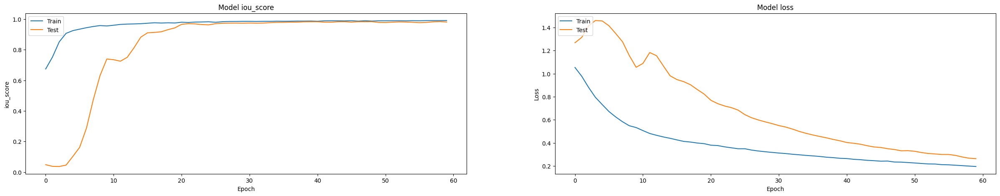

In [ ]:
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
x_test_dir = '/content/x_val_dir/'
y_test_dir = '/content/y_val_dir/'
x_test = sorted([x_test_dir + filename for filename in os.listdir(x_test_dir)])
y_test = sorted([y_test_dir + filename for filename in os.listdir(y_test_dir)])

In [ ]:
test_dataset = Dataset(
    x_test,
    y_test,
    classes=CLASSES,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
model.load_weights('best_model.h5')

In [ ]:
scores = model.evaluate(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

8/8 [==============================] - 0s 49ms/step - loss: 0.2520 - iou_score: 0.9855 - f1-score: 0.9927
Loss: 0.25202
mean iou_score: 0.98549
mean f1-score: 0.99268


1/1 [==============================] - 2s 2s/step


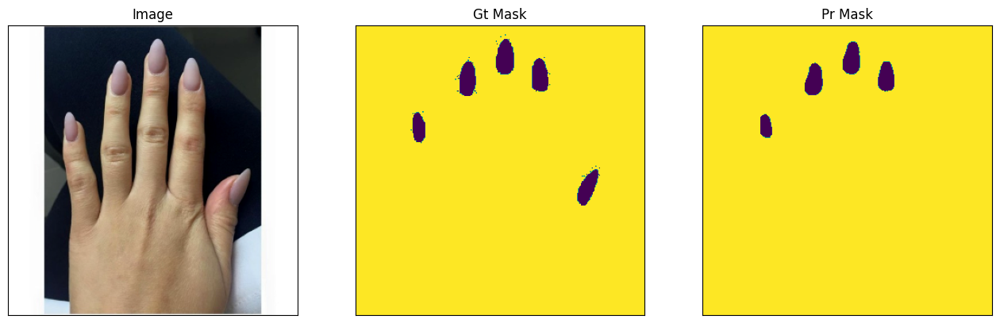

1/1 [==============================] - 0s 37ms/step


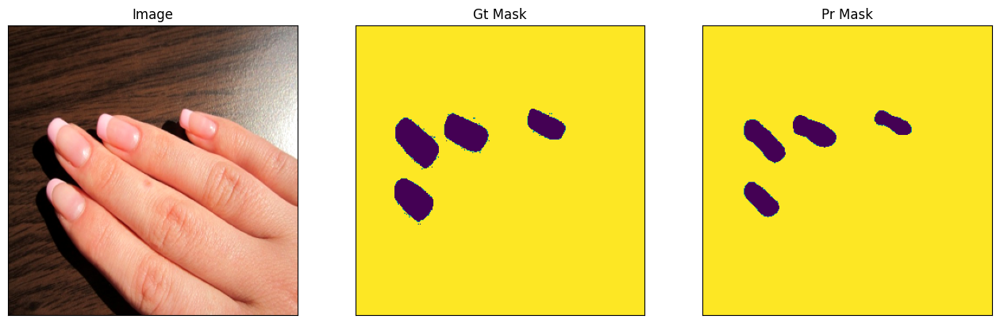

1/1 [==============================] - 0s 29ms/step


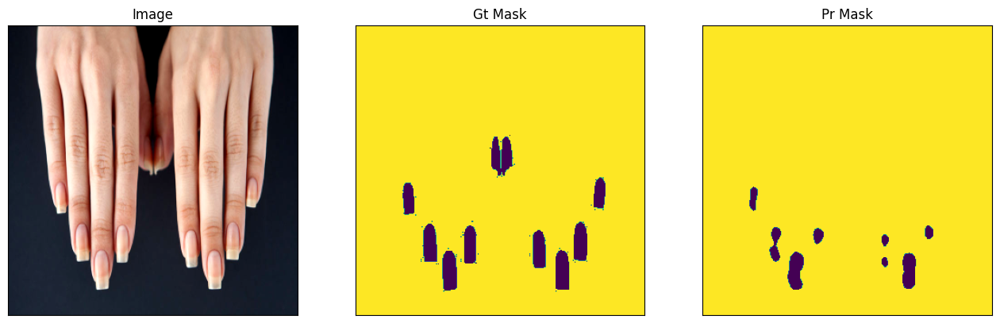

1/1 [==============================] - 0s 28ms/step


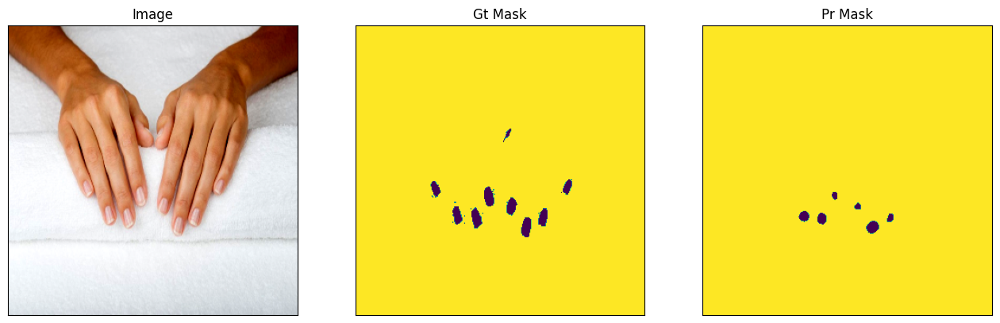

1/1 [==============================] - 0s 29ms/step


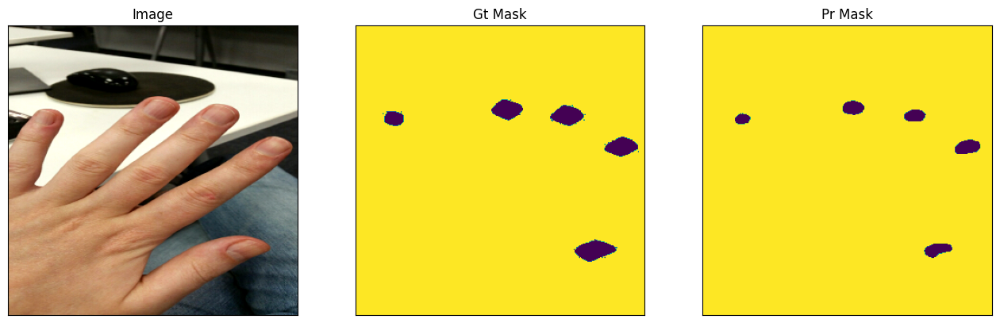

1/1 [==============================] - 0s 46ms/step


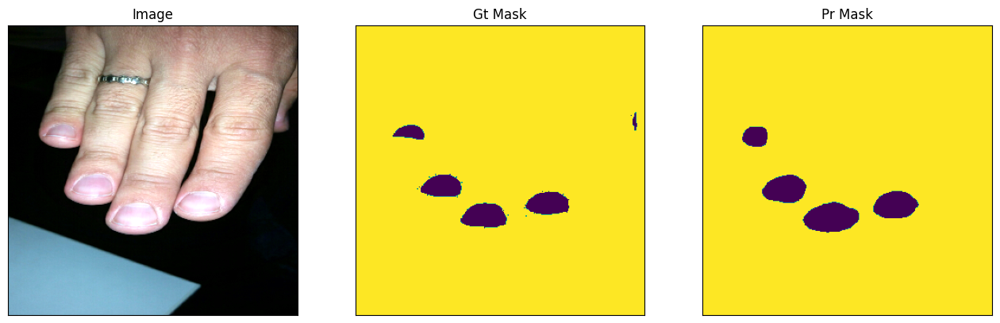

1/1 [==============================] - 0s 44ms/step


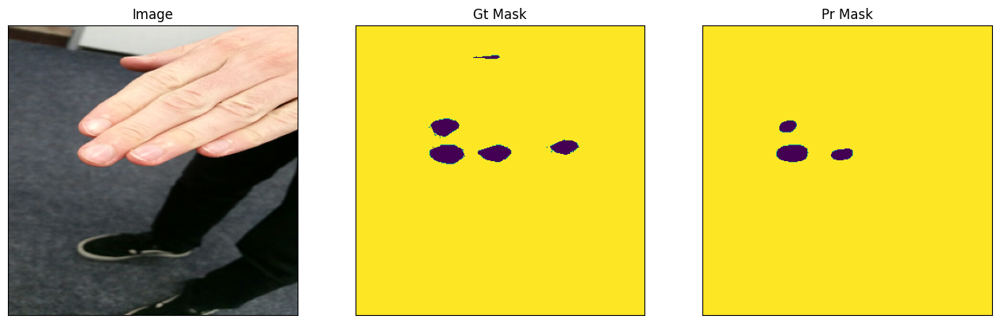

1/1 [==============================] - 0s 42ms/step


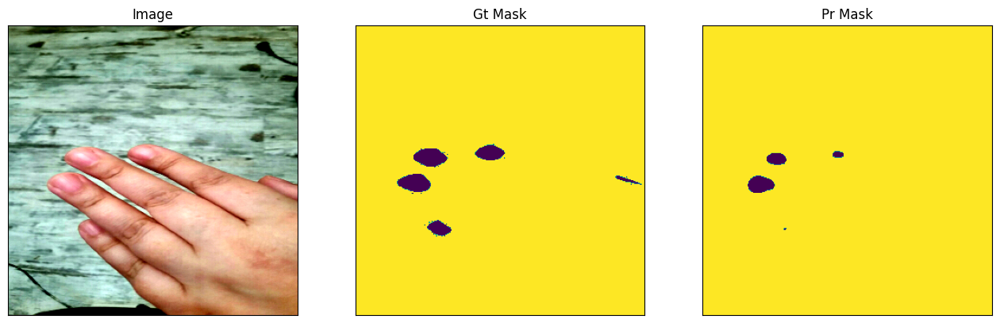

In [ ]:
n = 8
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range (8):

    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask[..., 0].squeeze(),
        pr_mask=pr_mask[..., 0].squeeze(),
    )

8

1/1 [==============================] - 0s 33ms/step


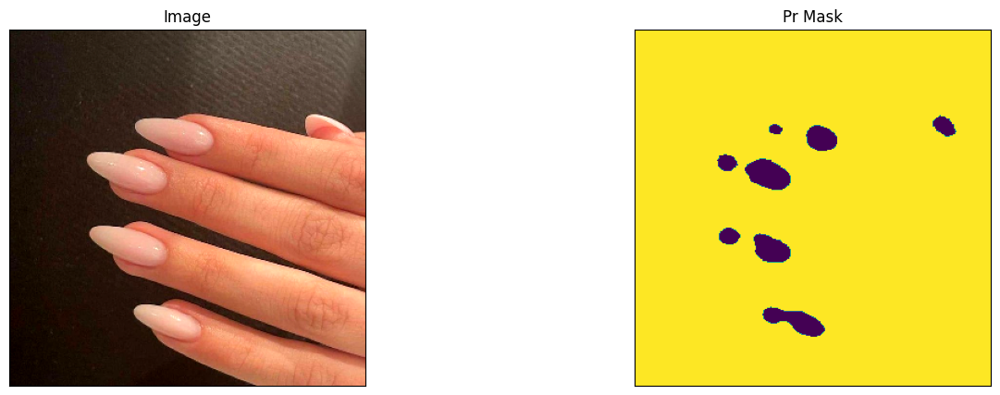

1/1 [==============================] - 0s 29ms/step


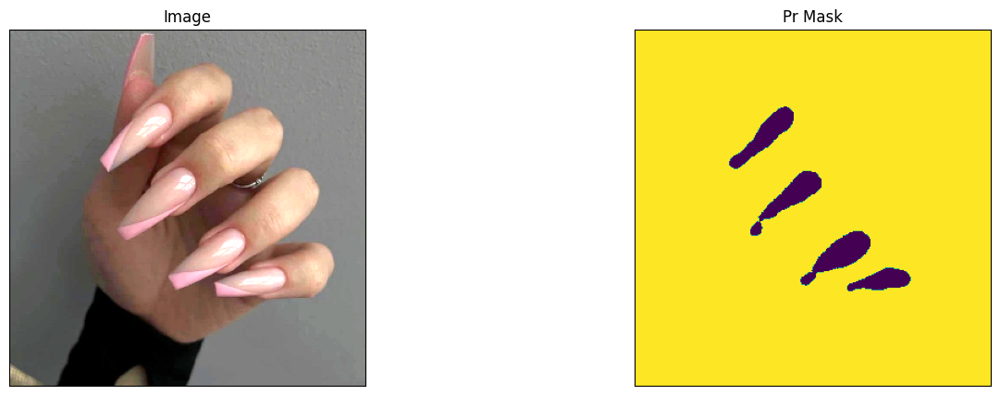

1/1 [==============================] - 0s 30ms/step


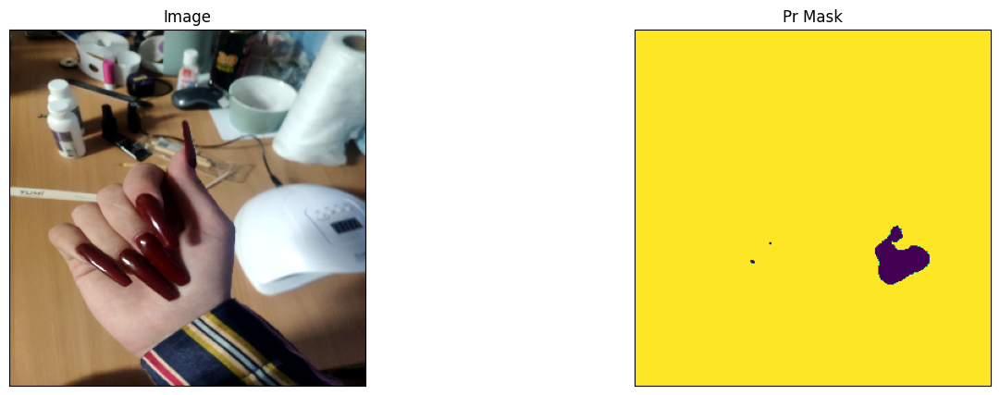

1/1 [==============================] - 0s 31ms/step


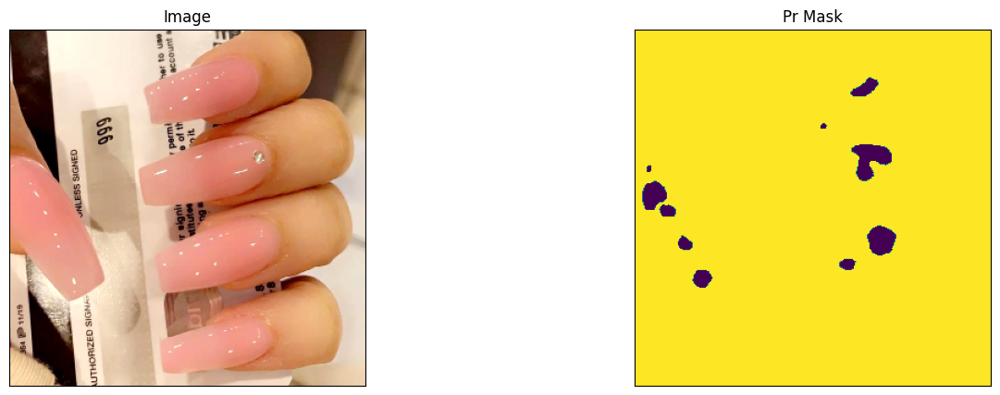

1/1 [==============================] - 0s 37ms/step


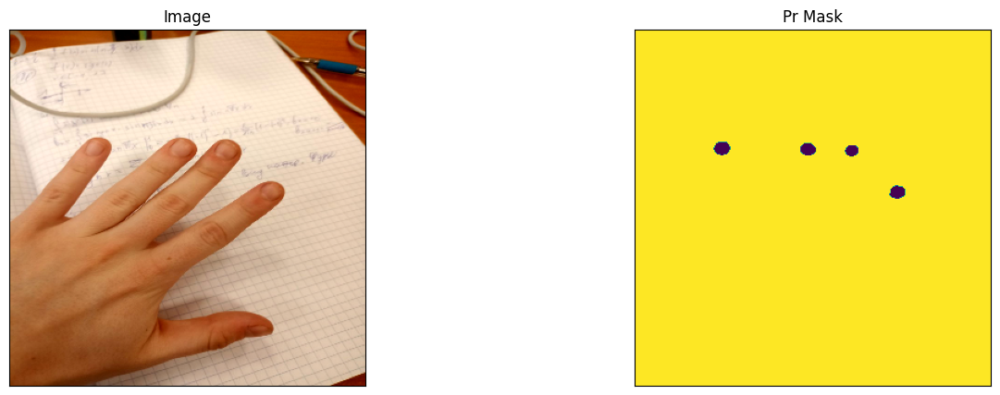

1/1 [==============================] - 0s 32ms/step


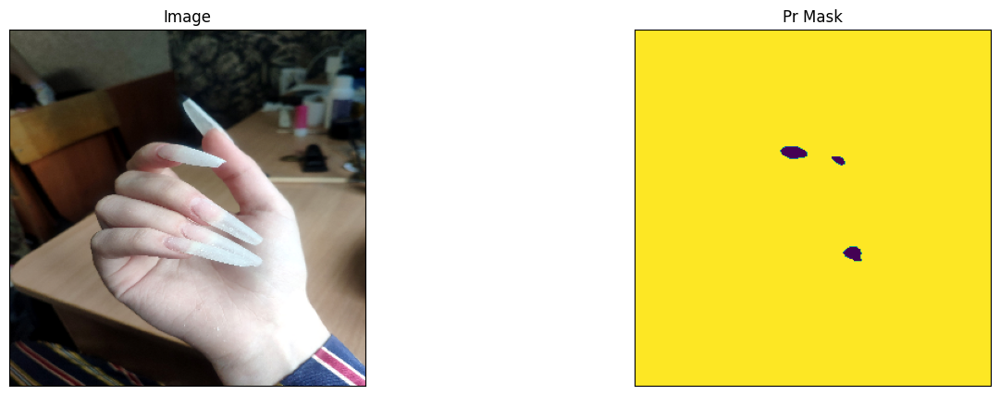

1/1 [==============================] - 0s 49ms/step


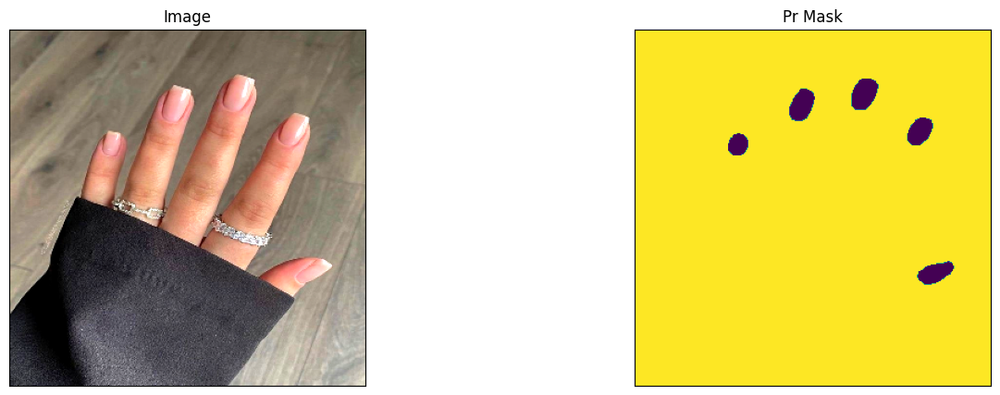

1/1 [==============================] - 0s 30ms/step


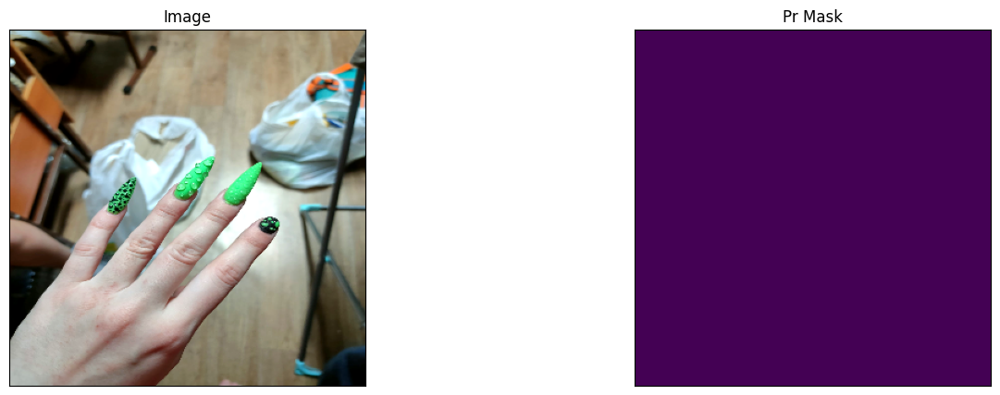

1/1 [==============================] - 0s 41ms/step


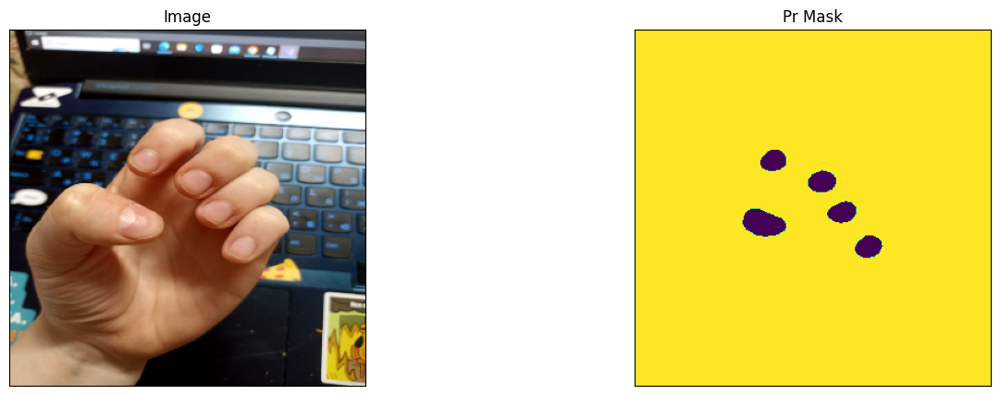

1/1 [==============================] - 0s 30ms/step


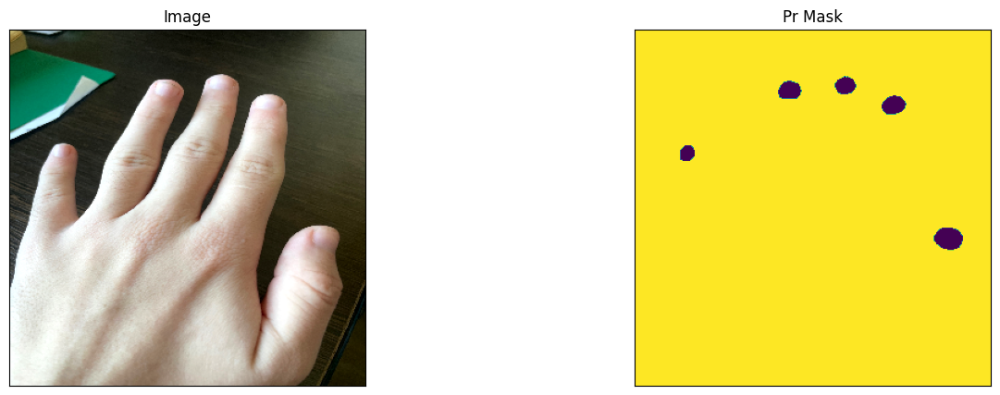

1/1 [==============================] - 0s 28ms/step


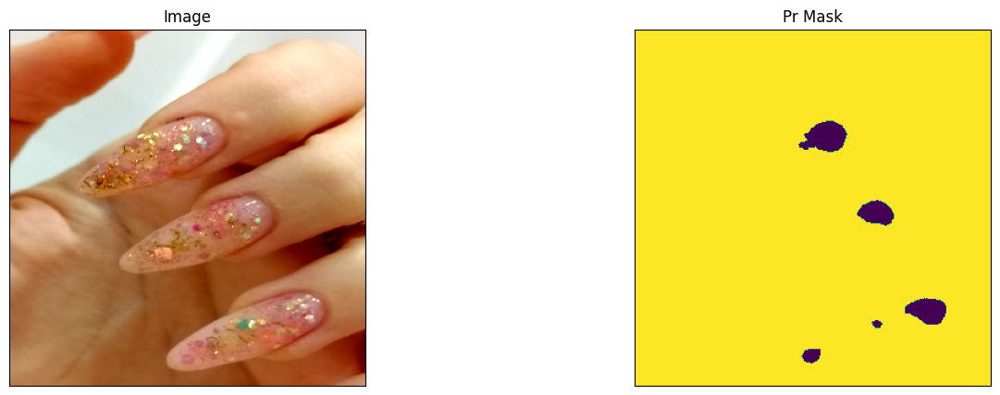

1/1 [==============================] - 0s 34ms/step


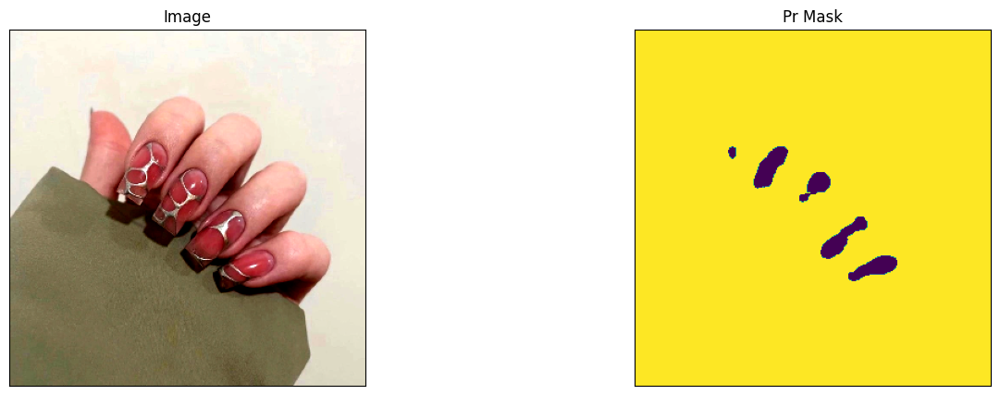

1/1 [==============================] - 0s 42ms/step


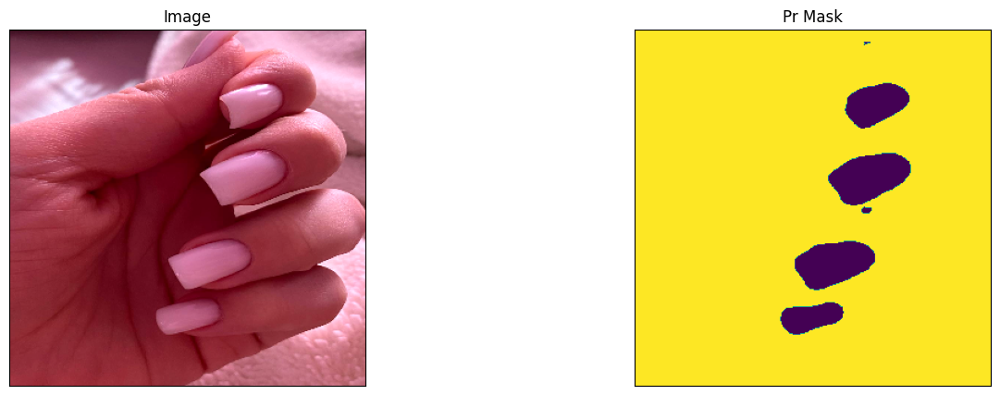

1/1 [==============================] - 0s 46ms/step


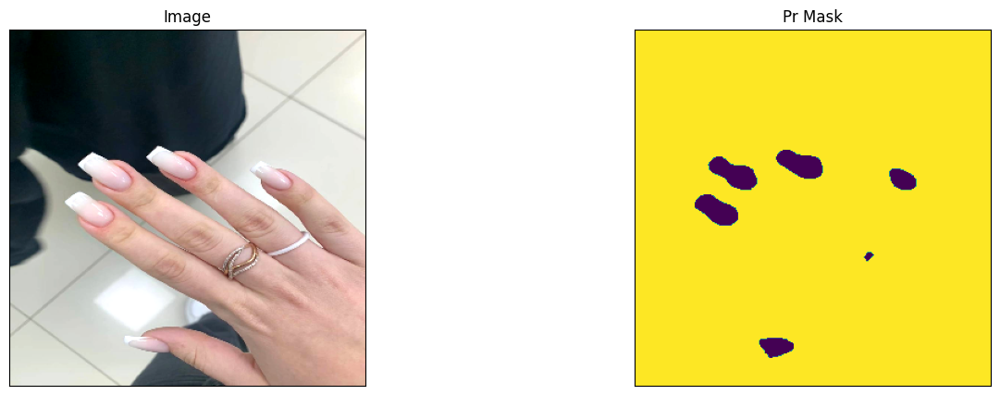

1/1 [==============================] - 0s 37ms/step


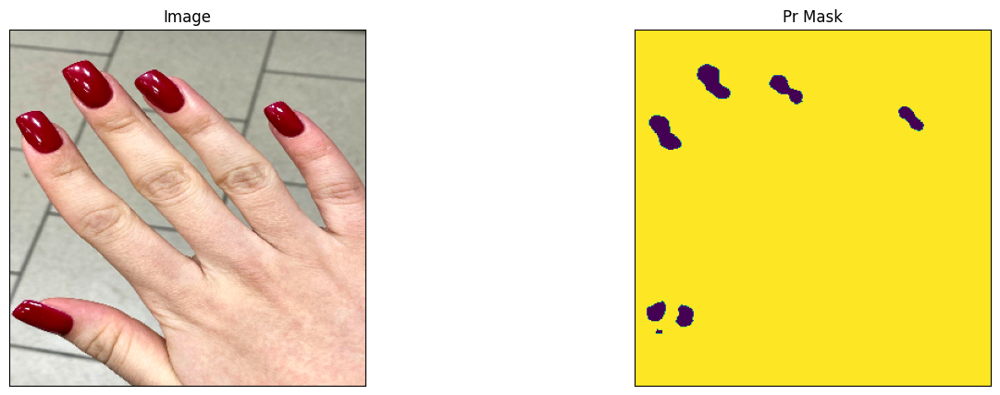

1/1 [==============================] - 0s 42ms/step


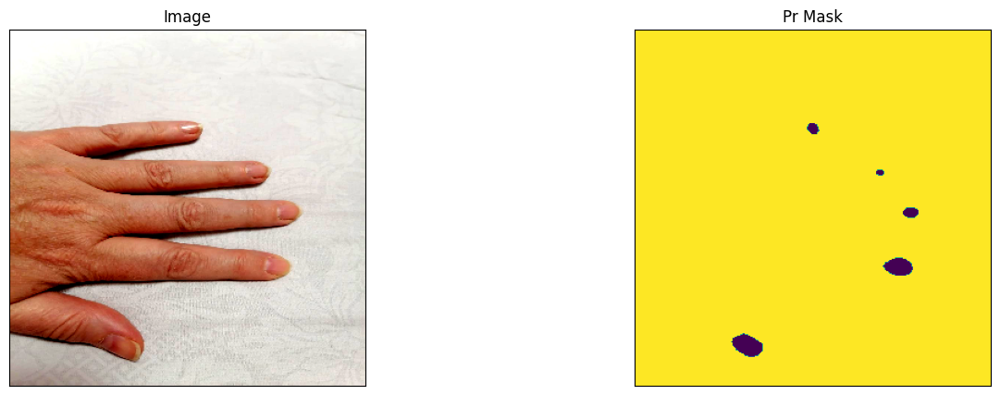

1/1 [==============================] - 0s 33ms/step


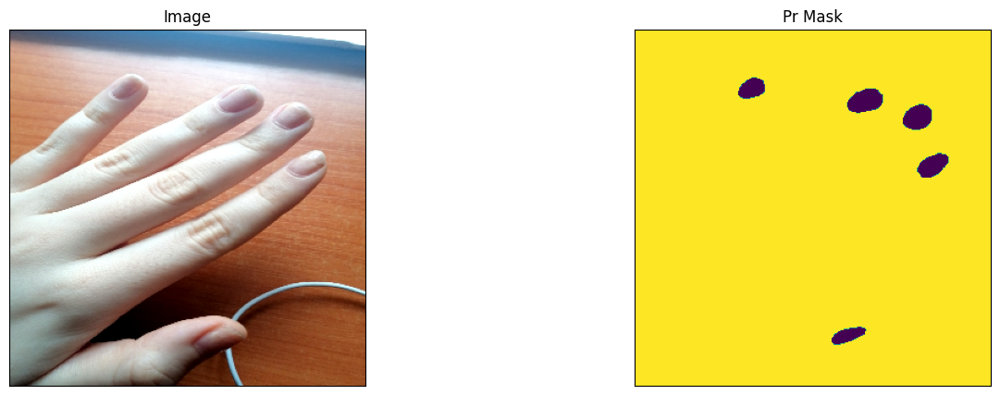

1/1 [==============================] - 0s 32ms/step


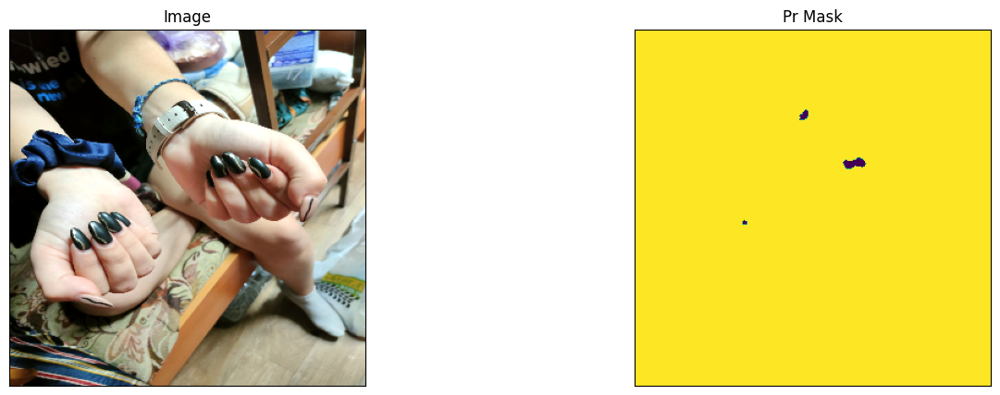

In [ ]:
my_test_dir = '/content/test1/'
x_test = sorted([my_test_dir + filename for filename in os.listdir(my_test_dir)])

for i in range (len(x_test)):
    image = cv2.imread(x_test[i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, [320, 320])
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    visualize(
        image=denormalize(image.squeeze()),
        pr_mask=pr_mask[..., 0].squeeze(),
    )